<a href="https://colab.research.google.com/github/jmwolf82/MLE_8/blob/main/hate_speech_detector.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<p align = "center" draggable=”false” ><img src="https://user-images.githubusercontent.com/37101144/161836199-fdb0219d-0361-4988-bf26-48b0fad160a3.png" 
     width="200px"
     height="auto"/>
</p>

# Hate Speech Detector

Today you are a machine learning engineer, a member of the Birdwatch at Twitter. 

The objective of this task is to detect hate speech in tweets. For the sake of simplicity, a tweet contains hate speech if it has a racist or sexist sentiment associated with it. In other words, we need to classify racist or sexist tweets from other tweets.

A labelled dataset of 31,962 tweets (late 2017 to early 2018) is provided in the form of a compressed csv file with each line storing a tweet id, its label, and the tweet. Label '1' denotes the tweet is racist/sexist while label '0' denotes the tweet is not racist/sexist.

We will first approach the problem in a traditional approach: clean the raw text using simple regex (regular expression), extract features, build a naive Bayes models to classify tweets; then we build a deep learning model and explain our deep learning model with LIME.

## 📚 Learning Objectives

By the end of this lesson, you will be able to:

- Understand the basic concepts in natural language processing (NLP)
- Perform basic NLP tasks on text, e.g., tweets
- Build a naive Bayes classifier to detect hate speech 
- Build a bidirectional long short-term memory (BiLSTM) to detect hate speech
- Visualize embeddings with Tensorboard embedding projector
- Explain models with LIME

# Task I: Data Preprocessing


1. Install dependencies.

    Most modules are pre-installed in Colab, however, we need to update `gensim` to its recent version and install `lime`.

In [1]:
!pip install -U -q gensim==4.2.0 lime

     |████████████████████████████████| 24.1 MB 3.4 MB/s 
     |████████████████████████████████| 275 kB 12.8 MB/s 


1. Connect Colab to your local Google Drive.

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


1. Use `pandas.read_csv` to load the tweets in `tweets.csv.gz` and save the `pd.DataFrame` into `raw`. Make sure the path points to where the data is located in your Google Drive. 

In [3]:
# YOUR CODE HERE
import pandas as pd

raw = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/week_10/tweets.csv.gz')

In [4]:
print(raw.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31962 entries, 0 to 31961
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      31962 non-null  int64 
 1   label   31962 non-null  int64 
 2   tweet   31962 non-null  object
dtypes: int64(2), object(1)
memory usage: 749.2+ KB
None


1. Sample 5 random tweets from the dataset for each label and display `label` and `tweet` columns. Hint: one option is to use `sample()` followed by `groupby`. 

In [5]:
# Colab includes an extension that renders pandas dataframes into interactive displays that can be filtered, sorted, and explored dynamically.
from google.colab import data_table
data_table.enable_dataframe_formatter() 
sample1 = raw.loc[raw['label']==1].sample(5)
sample0 = raw.loc[raw['label']==0].sample(5)
print(sample1)
print(sample0)
# YOUR CODE HERE

          id  label                                              tweet
19292  19293      1  #ifyousawinyouwhatisee you would believe the a...
15570  15571      1  #jeffsessions thinks we won't notice as he red...
12842  12843      1   vs #whites is unabated in #obamanation becaus...
4140    4141      1  word factory: race denial prevents healing! #s...
5116    5117      1                      peruvian women nds adult game
          id  label                                              tweet
25369  25370      0   @user   father's  day! have a wonderful and b...
9257    9258      0  @user this has arrived today.. let's get it st...
2232    2233      0  @user @user @user holy bad liar batman! you ne...
21812  21813      0   @user describe your father in 1 word  me : he...
6705    6706      0  #dwd #wetterwarnung starkes #gewitter in #schw...


1. The tweets are in English and all words should be already in lowercase. Now calculate the number of characters in each tweet and assign the values to a new column `len_tweet` in `raw`. 

In [6]:
# YOUR CODE HERE
sample1['len_tweet']= (sample1['tweet'].apply(len))
sample0['len_tweet']= (sample0['tweet'].apply(len))
print(sample1)
print(sample0)

          id  label                                              tweet  \
19292  19293      1  #ifyousawinyouwhatisee you would believe the a...   
15570  15571      1  #jeffsessions thinks we won't notice as he red...   
12842  12843      1   vs #whites is unabated in #obamanation becaus...   
4140    4141      1  word factory: race denial prevents healing! #s...   
5116    5117      1                      peruvian women nds adult game   

       len_tweet  
19292         80  
15570        107  
12842        106  
4140         101  
5116          30  
          id  label                                              tweet  \
25369  25370      0   @user   father's  day! have a wonderful and b...   
9257    9258      0  @user this has arrived today.. let's get it st...   
2232    2233      0  @user @user @user holy bad liar batman! you ne...   
21812  21813      0   @user describe your father in 1 word  me : he...   
6705    6706      0  #dwd #wetterwarnung starkes #gewitter in #schw... 

1. What are the summary statistics of `len_tweet` for each label? Hint: use `groupby` and `describe`. 

In [7]:
pd.set_option("display.precision", 1)

print(sample1.groupby('len_tweet').describe())
print(sample0.groupby('len_tweet').describe())
#sample0.describe()
# YOUR CODE HERE

             id                                                            \
          count     mean std      min      25%      50%      75%      max   
len_tweet                                                                   
30          1.0   5117.0 NaN   5117.0   5117.0   5117.0   5117.0   5117.0   
80          1.0  19293.0 NaN  19293.0  19293.0  19293.0  19293.0  19293.0   
101         1.0   4141.0 NaN   4141.0   4141.0   4141.0   4141.0   4141.0   
106         1.0  12843.0 NaN  12843.0  12843.0  12843.0  12843.0  12843.0   
107         1.0  15571.0 NaN  15571.0  15571.0  15571.0  15571.0  15571.0   

          label                                    
          count mean std  min  25%  50%  75%  max  
len_tweet                                          
30          1.0  1.0 NaN  1.0  1.0  1.0  1.0  1.0  
80          1.0  1.0 NaN  1.0  1.0  1.0  1.0  1.0  
101         1.0  1.0 NaN  1.0  1.0  1.0  1.0  1.0  
106         1.0  1.0 NaN  1.0  1.0  1.0  1.0  1.0  
107         1.0  1.

Note we have an imbalanced dataset: the ratio of non-hate speech to hate speech is roughly 13:1. 

1. Clean the tweets. 

    We use `re` to perform basic text manipulations. Specically, remove anonymized user handle, remove numbers and special characters except hashtags.

In [8]:
import re

1. Remove user handles from the text in `tweet`, or anything directly following the symbols `@`, and save the resulting tweets to a new column `tidy_tweet` in `raw`. 
    
    Hint: you can use `re.sub` on individual text and [`apply`](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.apply.html) a simple lambda function for the series `raw['tweet']`.

In [9]:
regex = r"\@[^ ]*" 
raw['tidy_tweet'] = raw['tweet'].str.replace(regex, '') 
raw.sample(10, random_state=203) 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: The default value of regex will change from True to False in a future version.
  


,id,label,tweet,tidy_tweet
790,791,1,@user and you keep telling that only aryans ar...,and you keep telling that only aryans are all...
21928,21929,0,@user what makes you ?,what makes you ?
25642,25643,0,"â #nzd/usd extends rbnz-led rally, hits fre...","â #nzd/usd extends rbnz-led rally, hits fre..."
20436,20437,0,i'm on a mission to ride all of the animals! ...,i'm on a mission to ride all of the animals! ...
22552,22553,0,the color of a human skin matters a lot to the...,the color of a human skin matters a lot to the...
20014,20015,0,#kimkardashian what do you think at this wife ...,#kimkardashian what do you think at this wife ...
8796,8797,1,the latest the all in one news24 daily! thank...,the latest the all in one news24 daily! thank...
24859,24860,0,#arbor bull up: you will dominate your bull ...,#arbor bull up: you will dominate your bull ...
13195,13196,0,âð¼ï¸â¤ï¸ð love my @user suitcase. l...,âð¼ï¸â¤ï¸ð love my suitcase. lookin...
14679,14680,0,really love this picture of bride anna with he...,really love this picture of bride anna with he...


1. Remove non-alphabetic characters yet keep symbols `#` from `tidy_tweet` and save the result in `tidy_tweet`. In other words, keep all 26 letters and `#`.

    Note: in some applications, punctuations, emojis, or whether the word is in all caps can be of use. You shall decide whether to extract such features for the application and perform error analysis to gain insight. 

In [10]:
regex = r"([^a-zA-Z# ])"

raw['tidy_tweet'] = raw['tidy_tweet'].str.replace(regex, '')
raw.sample(10, random_state=203)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: The default value of regex will change from True to False in a future version.
  This is separate from the ipykernel package so we can avoid doing imports until


,id,label,tweet,tidy_tweet
790,791,1,@user and you keep telling that only aryans ar...,and you keep telling that only aryans are all...
21928,21929,0,@user what makes you ?,what makes you
25642,25643,0,"â #nzd/usd extends rbnz-led rally, hits fre...",#nzdusd extends rbnzled rally hits fresh yea...
20436,20437,0,i'm on a mission to ride all of the animals! ...,im on a mission to ride all of the animals #...
22552,22553,0,the color of a human skin matters a lot to the...,the color of a human skin matters a lot to the...
20014,20015,0,#kimkardashian what do you think at this wife ...,#kimkardashian what do you think at this wife ...
8796,8797,1,the latest the all in one news24 daily! thank...,the latest the all in one news daily thanks t...
24859,24860,0,#arbor bull up: you will dominate your bull ...,#arbor bull up you will dominate your bull a...
13195,13196,0,âð¼ï¸â¤ï¸ð love my @user suitcase. l...,love my suitcase looking forward to my time ...
14679,14680,0,really love this picture of bride anna with he...,really love this picture of bride anna with he...


1. Remove words that is shorter than 4 words from the processed tweets.

    For example, 
      
    `i m on a mission to ride all of the animals #teamchanlv #vegas #lasvegas #funtimes`
      
    will be reduced to 
      
    `mission ride animals #teamchanlv #vegas #lasvegas #funtimes`


In [11]:
regex = r"\b(\w{1,3})\b"

raw['tidy_tweet'] = raw['tidy_tweet'].str.replace(regex, '')
raw.sample(10, random_state=203)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: The default value of regex will change from True to False in a future version.
  This is separate from the ipykernel package so we can avoid doing imports until


,id,label,tweet,tidy_tweet
790,791,1,@user and you keep telling that only aryans ar...,keep telling that only aryans allowed rap...
21928,21929,0,@user what makes you ?,what makes
25642,25643,0,"â #nzd/usd extends rbnz-led rally, hits fre...",#nzdusd extends rbnzled rally hits fresh yea...
20436,20437,0,i'm on a mission to ride all of the animals! ...,mission ride animals #teamchanlv #veg...
22552,22553,0,the color of a human skin matters a lot to the...,color human skin matters system when c...
20014,20015,0,#kimkardashian what do you think at this wife ...,#kimkardashian what think this wife #
8796,8797,1,the latest the all in one news24 daily! thank...,latest news daily thanks #africa
24859,24860,0,#arbor bull up: you will dominate your bull ...,#arbor bull will dominate your bull will...
13195,13196,0,âð¼ï¸â¤ï¸ð love my @user suitcase. l...,love suitcase looking forward time # #...
14679,14680,0,really love this picture of bride anna with he...,really love this picture bride anna with dog...


1. Remove stop words and text normalization. 
    
    We will use `stopwords` collection and `SnowballStemmer` in `nltk` for this task. Before doing so, we need to tokenize the tweets. Tokens are individual terms or words, and tokenization is simply to split a string of text into tokens. You can use [`str.split()`](https://docs.python.org/3/library/stdtypes.html#str.split) on individual text and [`apply`](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.apply.html) a simple lambda function for the series `raw['tidy_tweet']` and save the result into `tokenized_tweet`. 
    
    Check out some methods for the built-in type `str` [here](https://docs.python.org/3/library/stdtypes.html#string-methods).

In [12]:
#import nltk
#from nltk import SnowballStemmer
#from nltk.corpus import stopwords

#tokenized_tweet = raw['tidy_tweet'].str.split(' ')# YOUR CODE HERE
tokenized_tweet = raw['tidy_tweet'].apply(lambda x: x.split())
tokenized_tweet.head()

0    [when, father, dysfunctional, selfish, drags, ...
1    [thanks, #lyft, credit, cant, cause, they, don...
2                              [bihday, your, majesty]
3                     [#model, love, take, with, time]
4                   [factsguide, society, #motivation]
Name: tidy_tweet, dtype: object

1. Extract stop words and remove them from the tokens.

    Note: depending on the task / industry, it is highly recommended that one curate custom stop words. 

In [13]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
stop_words = stopwords.words('english')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [14]:
#tokenized_tweet = # YOUR CODE HERE
tokenized_tweet = tokenized_tweet.apply(lambda x: [word for word in x if not word in stop_words])
#for idx, tweet in enumerate(tokenized_tweet):
#  for subIdx, word in enumerate(tweet):
#    if word in stop_words:
#      del tokenized_tweet[idx][subIdx]
#    if word == '':
#      del tokenized_tweet[idx][subIdx]
tokenized_tweet.head()
  

0    [father, dysfunctional, selfish, drags, kids, ...
1    [thanks, #lyft, credit, cant, cause, dont, off...
2                                    [bihday, majesty]
3                           [#model, love, take, time]
4                   [factsguide, society, #motivation]
Name: tidy_tweet, dtype: object

In [15]:
assert any(word in tokenized_tweet for word in stop_words) == False

1. Create a new instance of a language specific [`SnowballStemmer`](https://www.nltk.org/api/nltk.stem.snowball.html), set the `language` to be "english"; see [how to](https://www.nltk.org/howto/stem.html). 

In [16]:
from nltk.stem.snowball import SnowballStemmer
stemmer = SnowballStemmer("english", ignore_stopwords=True)# YOUR CODE HERE

In [17]:
tokenized_tweet = tokenized_tweet.apply(lambda x: [stemmer.stem(i) for i in x]) 
tokenized_tweet.head()

0    [father, dysfunct, selfish, drag, kid, dysfunc...
1    [thank, #lyft, credit, cant, caus, dont, offer...
2                                    [bihday, majesti]
3                           [#model, love, take, time]
4                         [factsguid, societi, #motiv]
Name: tidy_tweet, dtype: object

1. Lastly, let's stitch these tokens in `tokenized_tweet` back together and save them in `raw['tidy_tweet']`. Use [`str.join()`](https://docs.python.org/3/library/stdtypes.html#str.join) and `apply`.

In [18]:
raw['tidy_tweet'] = tokenized_tweet.apply(lambda x: ' '.join(x))# YOUR CODE HERE
raw.head()

,id,label,tweet,tidy_tweet
0,1,0,@user when a father is dysfunctional and is s...,father dysfunct selfish drag kid dysfunct #
1,2,0,@user @user thanks for #lyft credit i can't us...,thank #lyft credit cant caus dont offer wheelc...
2,3,0,bihday your majesty,bihday majesti
3,4,0,#model i love u take with u all the time in ...,#model love take time
4,5,0,factsguide: society now #motivation,factsguid societi #motiv


# Task 2. Wordcloud and Hashtag

In this task, we want to gain a general idea of what the common words were and how hashtags were used in tweets. We will create wordclouds and extract the top hashtags used in each label. 

1. Before doing so, out of caution of possible data leakage, split the `raw['tidy_tweet']` into training and test datasets in a stratified fashion, set the test size at .25 and random state as 42.
    
    Save the results into `X_train`, `X_test`, `y_train`, and `y_test`.

In [19]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    raw['tidy_tweet'], raw.label, 
    test_size=0.25, random_state=42, stratify=raw.label)


In [20]:
assert X_train.shape == y_train.shape == (23971, )
assert X_test.shape == y_test.shape == (7991,)

1. A word cloud is a cluster of words depicted in different sizes. The bigger the word appears, the more often it appears in the given text. It can offer an easy visual presentation to reveal the theme of a topic. 

    Function `plot_wordcloud` is provided to plot 50 most frequent words from the given text in the shape of twitter's logo. You may need to replace the image path accordingly.

In [21]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

def plot_wordcloud(text:str) -> None:
    '''
    Plot a wordcloud of top 50 words from the input text
    masked by twitter logo
    '''
    mask = np.array(Image.open('/content/drive/MyDrive/Colab Notebooks/week_10/twitter-mask.png')) # REPLACE w/ YOUR FILE PATH
    wordcloud = WordCloud( 
        background_color='white', 
        random_state=42,
        max_words=50, 
        max_font_size=80, 
        mask = mask).generate(text)
    plt.figure(figsize=(10,10))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

1. Visualize the wordcloud. 

    That the function expects one long string. Stitch all tidy tweets from training set and save the single string to `all_words`, then visualize the wordcloud for all the words.

In [22]:
all_words = ' '.join(str(x)for x in X_train)# YOUR CODE HERE


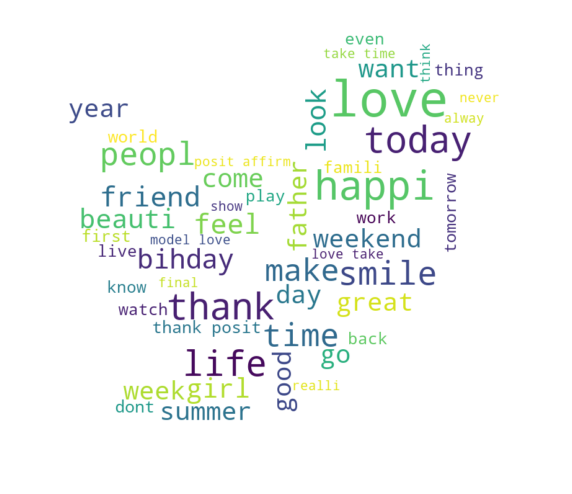

In [23]:
plot_wordcloud(all_words)

1. Visualize the wordcloud just for the text from the tweets identified as hate speech. 

    Similarly, you need to stitch all the tidy tweets in training set that were identified as hate speech. Save the long string to `negative_words`.

In [24]:
neg_rows = raw.loc[raw['label'] == 1]# YOUR CODE HERE
negative_words = ' '.join(str(x)for x in neg_rows.tidy_tweet)


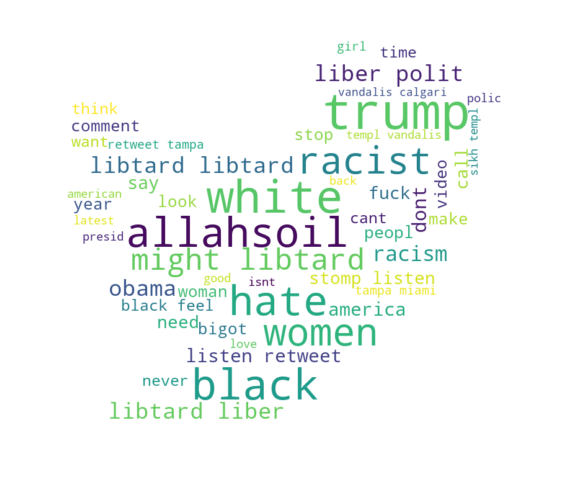

In [25]:
plot_wordcloud(negative_words)

1. Hashtag is a feature for tweets and we would like to inspect if hashtags provide information for our classification task. 

    Function `hashtag_extract` is provided to extract hashtags from an iterable (list or series) and return the hashtags in a list. 

In [26]:
def hashtag_extract(x) -> list:
    """
    extract hastags from an iterable (list or series) and 
    return the hashtags in a list.
    """
    hashtags = []
    # Loop over the words in the tweet
    for i in x:
        ht = re.findall(r"#(\w+)", i)
        hashtags.append(ht)
    return hashtags

1. Extract hashtags from non-hate speech tweets.

In [27]:
pos_rows = raw.loc[raw['label'] == 0]
HT_regular = hashtag_extract(pos_rows.tidy_tweet)# YOUR CODE HERE

In [28]:
assert type(HT_regular) == list
assert type(HT_regular[0]) == list # nested list

1. Now extract hashtags from hate speech tweets.

In [29]:
neg_rows = raw.loc[raw['label'] == 1]
HT_negative = hashtag_extract(neg_rows.tidy_tweet)# YOUR CODE HERE

1. Both `HT_regular` and `HT_negative` are nested lists, use the following trick to un-nest both lists.

In [30]:
HT_regular = sum(HT_regular,[])
HT_negative = sum(HT_negative,[])

In [31]:
assert type(HT_regular) == type(HT_negative) == list
assert type(HT_regular[0]) == type(HT_negative[0]) == str

1. Complete the function `top_hashtags` that takes a list of hashtags and return the top `n` hashtag keyword and its frequency. 

In [32]:
import operator
from typing import List, Tuple
from collections import Counter
def top_hashtags(hashtags:List[str], n=10) -> List[Tuple[str, int]]:
    ''' Function to return the top n hashtags '''
    # YOUR CODE HERE
    hash_dict = {}
    for i in hashtags:
      if i in hash_dict:
        hash_dict[i] +=1
      else:
        hash_dict[i] = 1    
    sort = sorted(hash_dict.items(), key=operator.itemgetter(1), reverse=True)[:10] #key=lambda item: item[1], reverse=True))  
    #print()
    #print(hash_dict)
    #most_common()
    return sort
    

1. Apply the function to the hashtag lists from the non-hate speech tweets and the hate speech tweets.

In [33]:
top_hashtags(HT_negative)
# YOUR CODE HERE

[('trump', 136),
 ('polit', 95),
 ('allahsoil', 92),
 ('liber', 81),
 ('libtard', 77),
 ('retweet', 63),
 ('black', 46),
 ('miami', 46),
 ('hate', 37),
 ('bigot', 36)]

In [34]:
# YOUR CODE HERE

1. Discuss: are these hashtags making sense? should we include them as features or should we strip the # before tokenizing (that is, treat "#love" the same as "love")? why and why not?

          YOUR ANSWER HERE

# Task 3. Features

Note that almost all the machine learning related Python modules expects numerical presentation of data; thus we need to transform our text first.We will experiment bag of words, tf-idf, and word2vec.  

1. Convert the collection of text documents to a matrix of token counts.

    Check the [official documentation](https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html). 
    
    Create an instance of `CountVectorizer` named `bow_vectorizer`, set `max_features` to be `MAX_FEATURES`.
    Learn the vocabulary dictionary and return document-term matrix and save it to `bow_train`. Use `.fit_transform`. 

In [35]:
from sklearn.feature_extraction.text import CountVectorizer
MAX_FEATURES = 1000


bow_vectorizer = CountVectorizer(max_features=MAX_FEATURES)# YOUR CODE HERE
bow_train = bow_vectorizer.fit_transform(X_train)# YOUR CODE HERE
#converting text to vectors

In [36]:
assert bow_train.shape == (X_train.shape[0], MAX_FEATURES)

1. Print the first three rows from `bow_train`. Hint: `.toarray()`.

In [37]:
# YOUR CODE HERE
bow_train_array = bow_train.toarray()
print(bow_train_array[0:3])

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [38]:
from scipy.sparse.csr import csr_matrix
assert type(bow_train) == csr_matrix

1. Similarly, convert the collection of text documents to a matrix of TF-IDF features.
    
    Create an instance of [`TfidfVectorizer`](https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html#sklearn.feature_extraction.text.TfidfVectorizer) named `tfidf_vectorizer`, set `max_features` to be `MAX_FEATURES`.

    Learn the vocabulary and idf, return document-term matrix and save it to `tfidf_train`. 

In [39]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [40]:
tfidf_vectorizer = TfidfVectorizer(max_features=MAX_FEATURES, stop_words='english')  # YOUR CODE HERE
tfidf_train = tfidf_vectorizer.fit_transform(X_train)

In [41]:
assert type(tfidf_train) == csr_matrix
assert tfidf_train.shape == bow_train.shape == (X_train.shape[0], MAX_FEATURES)

1. Extract word embedding using Word2Vec. We will use [`gensim`](https://radimrehurek.com/gensim/auto_examples/tutorials/run_word2vec.html) for this task. 
    
    The Word2Vec model takes either a list of lists of tokens or an iterable that streams the sentences directly from disk/network. Here, we tokenize the tidy tweets in `X_train` and save the list (`pd.series`) of lists of tokens to `tokenized_tweet`. 

In [42]:
import gensim.models 
from gensim.models import Word2Vec 

# a subset or normalization
# converting sentences into tokens, turn string into a tokenized representation (split a string into individual words)
#X_train[0]
tokenized_tweet = X_train.apply(lambda x: x.split())
# = Word2Vec(sentences=X_train_new)# YOUR CODE HERE

In [43]:
assert tokenized_tweet.shape == X_train.shape

In [44]:
tokenized_tweet.head()

1036     [like, spread, peanut, butter, white, bread, #...
2380     [watch, made, america, simpson, interest, went...
31605    [franci, underwood, seen, leav, marseill, #nojok]
23437    [#, #enjoy, #music, #today, #free, #app, #free...
2669     [#juic, experi, #notsobad, #healthyliv, #eatcl...
Name: tidy_tweet, dtype: object

1. Import `Word2Vec` from `gensim.models`; see [doc](https://radimrehurek.com/gensim/models/word2vec.html#gensim.models.word2vec.Word2Vec). 

    Create a skip-gram `Word2Vec` instance named `w2v` that learns on the `tokenized_tweet`, with `vector_size` set at `MAX_FEATURES`, and other parameters are provided. 

In [45]:
from gensim.models import Word2Vec

In [62]:
w2v = Word2Vec(
        # YOUR CODE HERE
        # YOUR CODE HERE
        tokenized_tweet,
        vector_size = MAX_FEATURES,
        window=5, min_count=2, sg = 1, 
        hs = 0, negative = 10,  workers= 2, 
        seed = 34)

1. Train the skip-gram model, set the epochs at 20.

In [63]:
%%time
#w2v.build_vocab(tokenized_tweet)
w2v.train(tokenized_tweet, total_examples=len(tokenized_tweet), epochs=20)
# YOUR CODE HERE

CPU times: user 1min 21s, sys: 145 ms, total: 1min 21s
Wall time: 43.6 s


(2699872, 3305620)

1. Let's see how the model performs. Specify a word (e.g., 'dinner' or 'trump') and print out the 10 most similar words from the our tweets in the training set. Use [`most_similar`](https://radimrehurek.com/gensim/models/keyedvectors.html#gensim.models.keyedvectors.KeyedVectors.most_similar). Hint: print the type of `w2v` and `w2v.wv`.

In [71]:
# YOUR CODE HERE
w2v.wv.most_similar(positive='trump')

[('donald', 0.6159340143203735),
 ('selfinterest', 0.5982681512832642),
 ('unstabl', 0.5899225473403931),
 ('unfit', 0.5736153721809387),
 ('associ', 0.563525378704071),
 ('stem', 0.5562146306037903),
 ('croni', 0.5559197068214417),
 ('presumpt', 0.5557688474655151),
 ('campaign', 0.554793119430542),
 ('capitalist', 0.553160548210144)]

In [72]:
tokenized_tweet.head()

1036     [like, spread, peanut, butter, white, bread, #...
2380     [watch, made, america, simpson, interest, went...
31605    [franci, underwood, seen, leav, marseill, #nojok]
23437    [#, #enjoy, #music, #today, #free, #app, #free...
2669     [#juic, experi, #notsobad, #healthyliv, #eatcl...
Name: tidy_tweet, dtype: object

1. Discuss: how does it calculate the similarities? 

    YOUR ANSWER HERE
    self-supervised 

1. Discuss: do you think Word2Vec is supervised or unsupervised?

    YOUR ANSWER HERE

1. Engineer features. 

    For each tweet, we calculate the average of embeddings (function `word_vector`) and then apply it to every tidy tweet in `X_train` (use function `tokens_to_array`).
    Both functions are provided, inspect the code and save the features in `w2v_train`.

In [73]:
from gensim.models.keyedvectors import KeyedVectors

def word_vector(tokens:list, size:int, keyed_vec:KeyedVectors= w2v.wv):
    vec = np.zeros(size).reshape((1, size))
    count = 0
    for word in tokens:
        try:
            vec += keyed_vec[word].reshape((1, size))
            count += 1
        except KeyError: 
            # handling the case where the token is not in vocabulary        
            continue
    if count != 0:
        vec /= count
    return vec

def tokens_to_array(tokens:list, size:int, keyed_vec:KeyedVectors= w2v.wv):
    array = np.zeros((len(tokens), size))
    for i in range(len(tokens)):
        array[i,:] = word_vector(tokens.iloc[i], size, keyed_vec=keyed_vec)
    return array

In [81]:
w2v_train = tokens_to_array(tokenized_tweet, MAX_FEATURES, w2v.wv)# YOUR CODE HERE

In [82]:
assert w2v_train.shape == (X_train.shape[0], MAX_FEATURES)

1. Prepare the test data before modeling for each approach:


  - extract features from `X_test` using the bag of words approach; use `bow_vectorizer`
  - extract features from `X_test` using the tf-idf approach; use `tfidf_vectorizer`
  - extract features from `X_test` using Word2Vec embeddings; you need to first tokenized the tidy tweets in `X_test`, then convert the tokens to array of shape `(X_test.shape[0], MAX_FEATURES)`.

In [83]:
bow_test = bow_vectorizer.transform(X_test)# YOUR CODE HERE
tfidf_test = tfidf_vectorizer.transform(X_test)# YOUR CODE HERE

tokenized_tweet_test = X_test.apply(lambda x: x.split())# YOUR CODE HERE
w2v_test = tokens_to_array(tokenized_tweet_test, MAX_FEATURES, w2v.wv)# YOUR CODE HERE

In [84]:
assert bow_test.shape == tfidf_test.shape == w2v_test.shape == (X_test.shape[0], MAX_FEATURES)

# Task 4. Naive Bayes classifiers

In this task, you will build a [naive Bayes](https://sebastianraschka.com/Articles/2014_naive_bayes_1.html) (here's another [ref](https://www.inf.ed.ac.uk/teaching/courses/inf2b/learnnotes/inf2b-learn07-notes-nup.pdf)), classifiers to identify the hate speech tweets using different sets of features from the last task, and evaluate their performances. 

In the era of deep learning, naive Bayes is useful due to its simplicity and reasonable performance, especially if there is not much training data available. A common interview question is "Why is naive Bayes naive?". 

We will use multi-variate Bernoulli naive Bayes [`BernoulliNB`](https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.BernoulliNB.html); try other flavors of [naive Bayes](https://scikit-learn.org/stable/modules/classes.html#module-sklearn.naive_bayes) if time permits. Code is pretty straightforward. 

1. Import `BernoulliNB` for modeling and `classification_report` for reporting performance. 

In [85]:
from sklearn.naive_bayes import BernoulliNB
from sklearn.metrics import classification_report

1. Create an instance of  `BernoulliNB` named `BNBmodel`. 

    We can use it for all three feature sets.

In [86]:
# YOUR CODE HERE
BNBmodel = BernoulliNB()

1. Train the multi-variate Bernoilli naive Bayes using bag of words features and print the performance report.

Why is naive bayes, naive?

In [87]:
BNBmodel.fit(bow_train, y_train)# YOUR CODE HERE (train the model)

BernoulliNB()

In [92]:
print(classification_report(y_test, BNBmodel.predict(bow_test)))# YOUR CODE HERE (report)
#BNBmodel.predict(bow_test)

              precision    recall  f1-score   support

           0       0.96      0.97      0.97      7430
           1       0.56      0.46      0.50       561

    accuracy                           0.94      7991
   macro avg       0.76      0.71      0.74      7991
weighted avg       0.93      0.94      0.93      7991



1. Similarly, train the model using tf-idf features and print the performance report. 

    Is the performance expected? Why or why not?

In [93]:
# YOUR CODE HERE
BNBmodel.fit(tfidf_train, y_train)

BernoulliNB()

In [94]:
# YOUR CODE HERE
print(classification_report(y_test, BNBmodel.predict(tfidf_test)))

              precision    recall  f1-score   support

           0       0.96      0.97      0.97      7430
           1       0.56      0.45      0.50       561

    accuracy                           0.94      7991
   macro avg       0.76      0.71      0.73      7991
weighted avg       0.93      0.94      0.93      7991



1. Finally, train the model using Word2Vec embeddings and report the performance. 

In [95]:
# YOUR CODE HERE
# YOUR CODE HERE
BNBmodel.fit(w2v_train, y_train)
print(classification_report(y_test, BNBmodel.predict(w2v_test)))

              precision    recall  f1-score   support

           0       0.98      0.84      0.91      7430
           1       0.28      0.81      0.41       561

    accuracy                           0.84      7991
   macro avg       0.63      0.82      0.66      7991
weighted avg       0.93      0.84      0.87      7991



1. Discuss the differences in performance using tf-idf vs skim-gram embedding. 

    YOUR ANSWER HERE

1. Examine a few tweets where the model(s) failed. What other features would you include in the next iteration?

    YOUR ANSWER HERE

In [96]:
y_pred = BNBmodel.predict(w2v_test)

In [174]:
print(y_pred.shape)
print(y_test.shape)
print(len(X_test))

tmp_array = []
for x in range(len(X_test)):
  val = (y_pred == y_test)
  tmp_array.append(val)

tmp = np.array([tmp_array])
#type(tmp)
#type(y_pred)
tmp[0][0]


(7991,)
(7991,)
7991


array([ True, False,  True, ...,  True, False,  True])

# Task 5. Bidirectional LSTM 

In this task, you will build a bidirectional LSTM (BiLSTM) model to detect tweets identified as hate speech, and visualize the embedding layer using Tensorboard projector. 

Why BiLSTM? LSTM, at its core, preserves information from inputs that has already passed through it using the hidden state. Unidirectional LSTM only preserves information of the past because the only inputs it has seen are from the past. BiLSTMs run inputs in both ways, one from past to future and one from future to past and show very good results as they can understand context better [ref](https://stackoverflow.com/questions/43035827/whats-the-difference-between-a-bidirectional-lstm-and-an-lstm).

1. Tokenizing and padding. 
    
    As LSTM expects every sentence to be of the same length, in addition to [`Tokenizer`](https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/text/Tokenizer) with a given number of vocabulary `VOCAB_SIZE`, we need to [pad](https://www.tensorflow.org/api_docs/python/tf/keras/utils/pad_sequences) shorter tweets with 0s until the length is `MAX_LEN` and truncate longer tweets to be exact `MAX_LEN` long. 
    
   Function `tokenize_pad_sequences` is provided except that you need to supply correct `num_words` and `filters`; do NOT filter `#`. 
   
   We feed the processed `tidy_tweet` to `tokenize_pad_sequences`, but one can perform the preprocessing steps in `Tokenizer` and apply it directly on the raw tweets.

In [176]:
VOCAB_SIZE = 25000  
MAX_LEN = 50

In [179]:
import tensorflow as tf
from tensorflow import keras

from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences

def tokenize_pad_sequences(text):
    '''
    tokenize the input text into sequences of integers and then
    pad each sequence to the same length
    '''
    # Text tokenization
    tokenizer = Tokenizer(
        num_words= VOCAB_SIZE,# YOUR CODE HERE
        filters='!"$%&()*+,-./:;<=>?@[\\]^_`{|}~\t\n',# YOUR CODE HERE
        lower=True, split=' ', oov_token='oov')
    tokenizer.fit_on_texts(text)
    # Transforms text to a sequence of integers
    X = tokenizer.texts_to_sequences(text)
    # Pad sequences to the same length
    X = pad_sequences(X, padding='post', maxlen=MAX_LEN)

    return X, tokenizer

In [180]:
print('Before Tokenization & Padding \n', raw['tidy_tweet'][0])
X, tokenizer = tokenize_pad_sequences(raw['tidy_tweet'])
print('After Tokenization & Padding \n', X[0])
y = raw['label'].values

Before Tokenization & Padding 
 father dysfunct selfish drag kid dysfunct #
After Tokenization & Padding 
 [  16 6290 2911 1631  213 6290    2    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0]


1. Let's split `X` into training and testing datasets, save 25% for testing. Then split training dataset into training and validation datasets, with 20% for validation. Set both `random_state` to be 42. Both splits shall be done by stratification.

In [301]:
len(X*0.25)

31962

In [332]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=42# YOUR CODE HERE
    )
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.20, random_state=42# YOUR CODE HERE
    )

In [333]:
print(len(X_test))
print(len(y_test))

7991
7991


In [334]:
print('Train Set ->', X_train.shape, y_train.shape)
print('Validation Set ->', X_val.shape, y_val.shape)
print('Test Set ->', X_test.shape, y_test.shape)

Train Set -> (19176, 50) (19176,)
Validation Set -> (4795, 50) (4795,)
Test Set -> (7991, 50) (7991,)


1. Now build a sequential model:

    - an embedding layer
    - a bidirectional LSTM with 32 units and set `return_sequences=True` in LSTM
    - a global average pooling operation for temporal data
    - a dropout layer with 20% rate
    - a dense layer of 32 units and set the activation function to be ReLu
    - a dense layer of 1 unit and set the proper activation function for classification

In [258]:
from keras.models import Sequential
from keras.layers import Embedding, LSTM, GlobalAveragePooling1D, Dropout
from keras.layers import Dense
# YOUR CODE HERE (layer imports)

EMBEDDING_DIM = 16   
model = Sequential([
    keras.layers.Embedding(VOCAB_SIZE, EMBEDDING_DIM),
    keras.layers.LSTM(32, return_sequences=True),
    keras.layers.GlobalAveragePooling1D(),
    keras.layers.Dropout(0.2),
    keras.layers.Dense(32, activation='relu'),
    keras.layers.Dense(1, activation='sigmoid')
])

In [246]:
model.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_7 (Embedding)     (None, None, 16)          400000    
                                                                 
 lstm_7 (LSTM)               (None, None, 32)          6272      
                                                                 
 global_average_pooling1d_6   (None, 32)               0         
 (GlobalAveragePooling1D)                                        
                                                                 
 dropout_5 (Dropout)         (None, 32)                0         
                                                                 
 dense_10 (Dense)            (None, 32)                1056      
                                                                 
 dense_11 (Dense)            (None, 1)                 33        
                                                      

1. Compile the model. 

    Fill in a proper loss function and use adam as the optimizer. For metrics, include precision and recall in the metrics, in addition to accuracy. 

In [259]:
from keras.metrics import Precision, Recall
model.compile(
    loss='binary_crossentropy',# YOUR CODE HERE
    optimizer='adam', 
    metrics= ['accuracy', 'Precision', 'Recall']#,'precision','recall']# YOUR CODE HERE]
    ) 

1. Train the model for 10 epochs on training dataset with a  validation set.

In [260]:
EPOCHS=10
BATCH_SIZE = 32
history = model.fit(X_train, y_train,
                    validation_data=(X_val, y_val),# YOUR CODE HERE
                    batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=2)

Epoch 1/10
600/600 - 42s - loss: 0.2104 - accuracy: 0.9381 - precision: 0.6220 - recall: 0.2757 - val_loss: 0.1439 - val_accuracy: 0.9514 - val_precision: 0.8790 - val_recall: 0.3920 - 42s/epoch - 69ms/step
Epoch 2/10
600/600 - 4s - loss: 0.0886 - accuracy: 0.9713 - precision: 0.8381 - recall: 0.7273 - val_loss: 0.1203 - val_accuracy: 0.9610 - val_precision: 0.8313 - val_recall: 0.5881 - 4s/epoch - 7ms/step
Epoch 3/10
600/600 - 4s - loss: 0.0488 - accuracy: 0.9853 - precision: 0.9193 - recall: 0.8640 - val_loss: 0.1397 - val_accuracy: 0.9602 - val_precision: 0.7885 - val_recall: 0.6250 - 4s/epoch - 7ms/step
Epoch 4/10
600/600 - 4s - loss: 0.0307 - accuracy: 0.9912 - precision: 0.9532 - recall: 0.9189 - val_loss: 0.1360 - val_accuracy: 0.9589 - val_precision: 0.7969 - val_recall: 0.5909 - 4s/epoch - 7ms/step
Epoch 5/10
600/600 - 4s - loss: 0.0214 - accuracy: 0.9943 - precision: 0.9693 - recall: 0.9482 - val_loss: 0.1675 - val_accuracy: 0.9604 - val_precision: 0.8022 - val_recall: 0.6108

1. Function `plot_graphs` is provided below to visualize how the performance of model progresses as a function of epoch. 

    Visualize accuracy and loss. 

In [200]:
def plot_graphs(history, metric):
  fig, ax = plt.subplots()
  plt.plot(history.history[metric])
  plt.plot(history.history['val_'+metric], '')
  ax.set_xticks(range(EPOCHS))
  plt.xlabel("Epochs")
  plt.ylabel(metric)
  plt.legend([metric, 'val_'+metric])

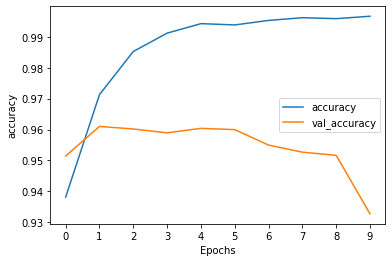

In [261]:
# YOUR CODE HERE
plot_graphs(history, 'accuracy')

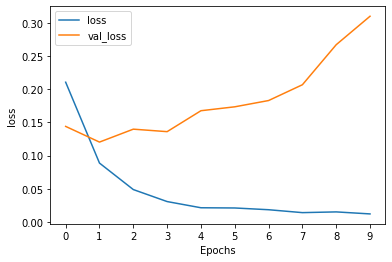

In [262]:
# YOUR CODE HERE
plot_graphs(history, 'loss')

1. The model starts to overfit in a couple of epochs. Consider using [early stopping](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping) to stop training when a monitored metric has stopped improving. 

    What can we do to tame overfitting?

        YOUR ANSWER HERE

1. Print the classification report of the model on test dataset. 

In [337]:
y_pred = model.predict(X_test)
y_pred_bool = np.argmax(y_pred, axis=1)
print(classification_report(y_test, y_pred_bool))



              precision    recall  f1-score   support

           0       0.93      1.00      0.96      7432
           1       0.00      0.00      0.00       559

    accuracy                           0.93      7991
   macro avg       0.47      0.50      0.48      7991
weighted avg       0.86      0.93      0.90      7991



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [327]:
y_pred_bool.shape
len(y_test)

7991

1. Discuss: how does the BiLSTM model improve the classification over naive Bayes? 

    YOUR ANSWER HERE

In [294]:
type(y_pred)
#len(X_test)

numpy.ndarray

In [ ]:
# # NB using tf-idf
#               precision    recall  f1-score   support

#            0       0.96      0.97      0.97      7430
#            1       0.55      0.48      0.51       561

#     accuracy                           0.94      7991
#    macro avg       0.75      0.72      0.74      7991
# weighted avg       0.93      0.94      0.93      7991

# # NB using word2vec
#               precision    recall  f1-score   support

#            0       0.98      0.85      0.91      7430
#            1       0.29      0.82      0.43       561

#     accuracy                           0.85      7991
#    macro avg       0.64      0.83      0.67      7991
# weighted avg       0.94      0.85      0.88      7991

1. Visualize embedding using [Embedding Projector](https://www.tensorflow.org/tensorboard/tensorboard_projector_plugin) in Tensorboard. The setup for Tensorboard can be tricky, most of the code is provided. 

    TensorBoard reads tensors and metadata from the logs of your tensorflow projects. The path to the log directory is specified with log_dir below. 
    
    In order to load the data into Tensorboard, we need to save a training checkpoint to that directory, along with metadata that allows for visualization of a specific layer of interest in the model.

    Load the TensorBoard notebook extension and import `projector` from `tensorboard.plugins`.

In [338]:
%load_ext tensorboard

In [339]:
from tensorboard.plugins import projector

1. Clear any logs from previous runs if any

In [340]:
rm -rf /logs/  

1. Set up a logs directory, so Tensorboard knows where to look for data.

In [341]:
import os
log_dir='/logs/tweets-example/'
if not os.path.exists(log_dir):
    os.makedirs(log_dir)

1. Save the first `VOCAB_SIZE` most frequent words in the vocabulary as `metadata.tsv`.

In [342]:
with open(os.path.join(log_dir, 'metadata.tsv'), "w") as f:
  i = 0
  for label in tokenizer.word_index.keys():
    if label == 'oov':
      continue # skip oov
    f.write("{}\n".format(label))
    if i > VOCAB_SIZE:
      break
    i += 1

1. Save the weights we want to analyze as a variable. Note that the first value represents any unknown word, which is not in the metadata, here we will remove this value.

In [343]:
weights = tf.Variable(model.layers[0].get_weights()[0][1:]) # `embeddings` has a shape of (num_vocab, embedding_dim) 

1. Create a checkpoint from embedding, the filename and key are the name of the tensor.

In [344]:
checkpoint = tf.train.Checkpoint(embedding=weights)
checkpoint.save(os.path.join(log_dir, "embedding.ckpt"))

'/logs/tweets-example/embedding.ckpt-1'

1. Set up config.

In [345]:
config = projector.ProjectorConfig()
embedding = config.embeddings.add()

1. The name of the tensor will be suffixed by `/.ATTRIBUTES/VARIABLE_VALUE`.

In [346]:
embedding.tensor_name = "embedding/.ATTRIBUTES/VARIABLE_VALUE"
embedding.metadata_path = 'metadata.tsv'
projector.visualize_embeddings(log_dir, config)

1. Verify the following files exist under the current directory

In [347]:
ls /logs/tweets-example/

checkpoint                            metadata.tsv
embedding.ckpt-1.data-00000-of-00001  projector_config.pbtxt
embedding.ckpt-1.index


1. Now run Tensorboard against on log data we just saved. 

    You may need to run this cell **twice** to see the projector correctly. Use Chrome for least friction.

In [349]:
%tensorboard --logdir /logs/tweets-example/

Reusing TensorBoard on port 6006 (pid 5090), started 0:00:50 ago. (Use '!kill 5090' to kill it.)

<IPython.core.display.Javascript object>

The TensorBoard Projector can be a great tool for interpreting and visualzing embedding. The dashboard allows users to search for specific terms, and highlights words that are adjacent to each other in the embedding (low-dimensional) space. Try a few word in the Search box and see if the embeddings make sense. 

# Task 6. Interpretation

Lastly let's try to understnad predictions by BiLSTM using a model agnostic approach -- [Local interpretable model-agnostic explanations (LIME)](https://christophm.github.io/interpretable-ml-book/lime.html)

1. Import `LimeTextExplainer` from the [`lime_text`](https://lime-ml.readthedocs.io/en/latest/lime.html#module-lime.lime_text) module in package [`lime`](https://github.com/marcotcr/lime)

In [350]:
from lime.lime_text import LimeTextExplainer

1. Create an instance of `LimeTextExplainer`, call it `explanier`. 

In [351]:
explainer = LimeTextExplainer(class_names=['no', 'yes'], random_state=2)

1. Method `explain_instance` expects the `classifier_fn` to be a function, we provide the function `predict_proba` as below. 

In [352]:
def predict_proba(arr):
    processed = tokenizer.texts_to_sequences(arr)
    processed = pad_sequences(processed, padding='post', maxlen=MAX_LEN)
    pred = model.predict(processed)
    r = []
    for i in pred:
        temp = i[0]
        r.append(np.array([1-temp,temp])) 
    return np.array(r)

1. Read about [`explain_instance`](https://lime-ml.readthedocs.io/en/latest/lime.html#lime.lime_text.LimeTextExplainer.explain_instance). 

    Create an instance named `exp` to explain the 16399th tidy tweet from the original dataset, i.e., `raw.tidy_tweet.iloc[16399]`. 

In [375]:
#(text_instance, classifier_fn, labels=(1, ), top_labels=None, num_features=10, num_samples=5000, distance_metric='cosine', model_regressor=None)
idx = 16399 
exp = explainer.explain_instance(
    raw.tidy_tweet.iloc[idx],
    classifier_fn=predict_proba,
    num_features=6)
exp.show_in_notebook(text=raw.tidy_tweet.iloc[idx])

1. Pick another random tweet and generate explanations for the prediction.

In [391]:
# YOUR CODE HERE
import random
idx = random.choice(range(raw.tidy_tweet.size)) 

exp = explainer.explain_instance(
    raw.tidy_tweet.iloc[idx],
    classifier_fn=predict_proba,
    num_features=6)
exp.show_in_notebook(text=raw.tidy_tweet.iloc[idx])

1. Jot down your observations in explaining the model. 

    YOUR ANSWER HERE

# Acknowledgement & Reference

- Data is adapted from [Twitter sentiment analysis](https://datahack.analyticsvidhya.com/contest/practice-problem-twitter-sentiment-analysis/#ProblemStatement)
- [Twitter sentiment analysis](https://github.com/prateekjoshi565/twitter_sentiment_analysis/blob/master/code_sentiment_analysis.ipynb) 
- [Introduction to Word Embedding and Word2Vec](https://towardsdatascience.com/introduction-to-word-embedding-and-word2vec-652d0c2060fa)
- [When to use GRU over LSTM?](https://datascience.stackexchange.com/questions/14581/when-to-use-gru-over-lstm)
- Use a trained Word2Vec, Doc2Vec or FastTest embedding by `gensim` in buiding an embedding layers in Tensorflow, here's [how-to](https://github.com/RaRe-Technologies/gensim/wiki/Using-Gensim-Embeddings-with-Keras-and-Tensorflow).